In [27]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/LICENSE
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/README.md
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/data.yaml
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/classes.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val/000000061651.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val/000000046509.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val/000000280785.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val/000000234858.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-datase

In [28]:
import kagglehub
import os

# Download latest version
path = kagglehub.dataset_download("haseebhsb/yolo-person-vehicle-detection-dataset-annotated")
print("Path to dataset files:", path)

# Store the dataset path
dataset_path = path
print(f"\nDataset downloaded to: {dataset_path}")


Path to dataset files: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated

Dataset downloaded to: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated


In [29]:
import os

# Check if the directory exists
if os.path.exists(dataset_path):
    print(f"Contents of '{dataset_path}':")
    for item in os.listdir(dataset_path):
        print(item)
else:
    print(f"Error: Directory '{dataset_path}' not found.")


Contents of '/kaggle/input/yolo-person-vehicle-detection-dataset-annotated':
yolo-person-vehicle-dataset


In [30]:
import os

# First, let's check what's actually in the dataset path
print(f"Exploring dataset structure in: {dataset_path}\n")

# Function to explore directory structure
def explore_directory(path, max_depth=3, current_depth=0):
    if current_depth > max_depth:
        return
    
    try:
        items = os.listdir(path)
        indent = "  " * current_depth
        print(f"{indent}Contents of '{path}':")
        
        for item in items:
            item_path = os.path.join(path, item)
            if os.path.isdir(item_path):
                print(f"{indent}  📁 {item}/")
                if current_depth < max_depth:
                    explore_directory(item_path, max_depth, current_depth + 1)
            else:
                print(f"{indent}  📄 {item}")
    except Exception as e:
        print(f"{indent}Error accessing {path}: {e}")

explore_directory(dataset_path, max_depth=2)

# Now try to find the correct dataset subdirectory
possible_paths = [
    os.path.join(dataset_path, 'dataset'),
    dataset_path,  # Sometimes the dataset folder IS the root
]

dataset_sub_path = None
for path in possible_paths:
    if os.path.exists(path):
        # Check if this path has 'images' and 'labels' folders
        contents = os.listdir(path)
        if 'images' in contents and 'labels' in contents:
            dataset_sub_path = path
            print(f"\n✅ Found dataset directory: {dataset_sub_path}")
            break

if dataset_sub_path is None:
    # If still not found, search for images and labels folders
    for root, dirs, files in os.walk(dataset_path):
        if 'images' in dirs and 'labels' in dirs:
            dataset_sub_path = root
            print(f"\n✅ Found dataset directory: {dataset_sub_path}")
            break

if dataset_sub_path:
    print(f"\nContents of dataset directory:")
    for item in os.listdir(dataset_sub_path):
        print(f"  - {item}")
else:
    print("\n❌ Could not find dataset directory with 'images' and 'labels' folders")


Exploring dataset structure in: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated

Contents of '/kaggle/input/yolo-person-vehicle-detection-dataset-annotated':
  📁 yolo-person-vehicle-dataset/
  Contents of '/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset':
    📁 dataset/
    Contents of '/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset':
      📁 labels/
      📁 images/
      📄 classes.txt
    📄 LICENSE
    📄 README.md
    📄 data.yaml

✅ Found dataset directory: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset

Contents of dataset directory:
  - labels
  - images
  - classes.txt


In [31]:
!pip install ultralytics

In [32]:
import ultralytics

print(f"Ultralytics version: {ultralytics.__version__}")


Ultralytics version: 8.4.7


In [33]:
!nvidia-smi

Sat Jan 24 15:51:41 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.172.08             Driver Version: 570.172.08     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   76C    P0             33W /   70W |    1751MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [34]:
import yaml
import os
from pathlib import Path

# Define DATASET_DIR (where the data is located - read-only)
DATASET_DIR = Path(dataset_sub_path)

# Define working directory (writable) for saving the YAML file
WORKING_DIR = Path('/kaggle/working')

# Read class names from classes.txt
classes_file = DATASET_DIR / 'classes.txt'
if classes_file.exists():
    with open(classes_file, 'r') as f:
        classes = [line.strip() for line in f if line.strip()]
else:
    classes = []
    print(f"Warning: '{classes_file}' not found or is empty. 'classes' list is empty.")

# Define yolo_data_config dictionary
yolo_data_config = {
    'path': str(DATASET_DIR.resolve()),
    'train': 'images/train',
    'val': 'images/val',
    'nc': len(classes),
    'names': classes
}

# Save the YAML file to /kaggle/working/ (writable directory)
yolo_yaml_path = WORKING_DIR / 'data_yolo.yaml'

# Write the configuration to the file
with open(yolo_yaml_path, 'w') as f:
    yaml.dump(yolo_data_config, f, sort_keys=False)

# Print confirmation
print(f"'data_yolo.yaml' file saved to: {yolo_yaml_path}\n")

print("Content of data_yolo.yaml:")
with open(yolo_yaml_path, 'r') as f:
    print(f.read())


'data_yolo.yaml' file saved to: /kaggle/working/data_yolo.yaml

Content of data_yolo.yaml:
path: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset
train: images/train
val: images/val
nc: 2
names:
- person
- vehicle



In [35]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8n model
model = YOLO('yolov8n.pt')

# Train the model
print("Initiating model training...")
model.train(data=str(yolo_yaml_path), epochs=15, imgsz=640, batch=16)
print("Model training completed.")


Initiating model training...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_yolo.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=1

In [36]:
from ultralytics import YOLO

# Load the trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluate the model on the validation set
print("Evaluating model performance...")
metrics = model.val(data=str(yolo_yaml_path))

# Print evaluation metrics
print("\nModel Evaluation Results:")
print(f"  mAP50-95: {metrics.box.map:.3f}")
print(f"  mAP50: {metrics.box.map50:.3f}")
print(f"  mAP75: {metrics.box.map75:.3f}")
print(f"  Precision: {metrics.box.mp:.3f}")
print(f"  Recall: {metrics.box.mr:.3f}")


Evaluating model performance...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 293.1±101.5 MB/s, size: 165.3 KB)
val: Scanning /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val... 400 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 400/400 1.1Kit/s 0.4s<0.1s
WARNING ⚠️ val: Cache directory /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 6.4it/s 3.9s0.1s
                   all        400        791      0.879      0.852      0.928      0.707
                person        264        467      0.908      0.849      0.944      0.674
               vehicle        208 

In [37]:
from ultralytics import YOLO
from pathlib import Path

# Load the best trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Define the directory for sample images
sample_images_dir = Path(dataset_sub_path) / 'images' / 'val'

# Perform inference
print("Running inference on sample images...")
results = model.predict(source=str(sample_images_dir), save=True, conf=0.25, iou=0.7)
print("Inference complete. Predictions saved.")

Running inference on sample images...

image 1/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000028302.jpg: 448x640 1 vehicle, 6.7ms
image 2/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029396.jpg: 480x640 1 person, 1 vehicle, 6.9ms
image 3/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029743.jpg: 480x640 1 vehicle, 6.1ms
image 4/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030291.jpg: 640x640 1 vehicle, 7.9ms
image 5/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030858.jpg: 480x640 1 vehicle, 6.7ms
image 6/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/0000000355

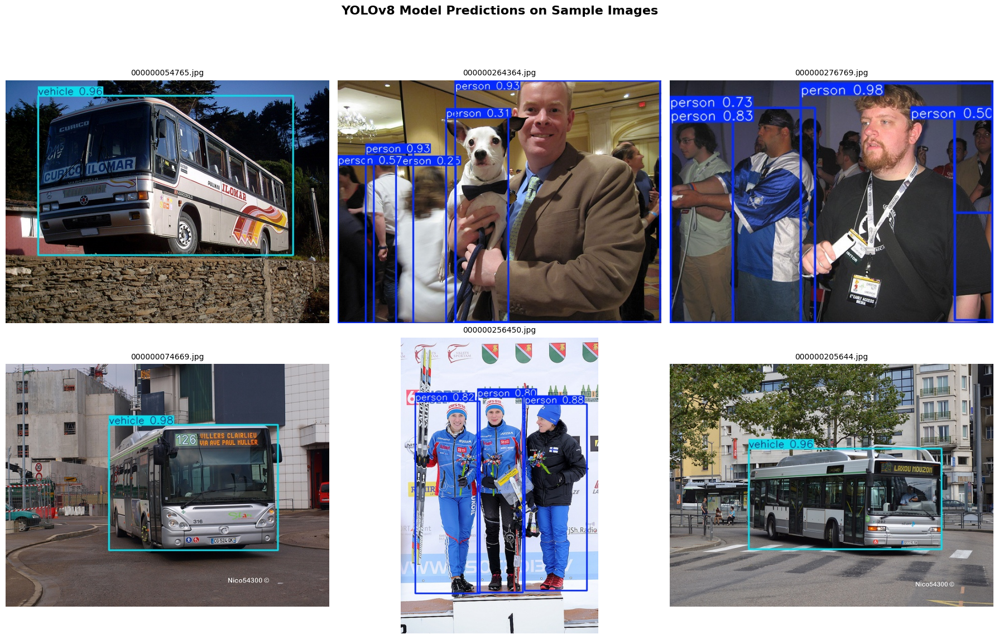

In [38]:
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# Get the directory where predict saved the results
prediction_output_dir = Path('/kaggle/working/runs/detect/predict')

# Get all image files from the prediction output directory
predicted_images = list(prediction_output_dir.glob('*.jpg')) + list(prediction_output_dir.glob('*.png'))

if predicted_images:
    # Select a random subset of images to display
    display_samples = random.sample(predicted_images, min(6, len(predicted_images)))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, img_path in enumerate(display_samples):
        img = Image.open(img_path)
        axes[idx].imshow(img)
        axes[idx].set_title(img_path.name, fontsize=10)
        axes[idx].axis('off')

    plt.suptitle('YOLOv8 Model Predictions on Sample Images', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
else:
    print("No predicted images found to display.")


In [39]:
from ultralytics import YOLO

# Load pre-trained YOLOv10n model
model = YOLO('yolov10n.pt')
print("YOLOv10n model loaded successfully.")

# Train with optimized parameters
print("Initiating optimized YOLOv10n training...")

model.train(
    data=str(yolo_yaml_path),
    epochs=25,
    imgsz=640,
    batch=16,
    augment=True,
    patience=0,
    save=True,
    verbose=True,
    plots=True,
    name='yolov10n_person_vehicle_full_epochs',
)

print("YOLOv10n training completed.")

YOLOv10n model loaded successfully.
Initiating optimized YOLOv10n training...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_yolo.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov10n_person_vehicle_full_epochs2, nbs=64, nms=F

In [40]:
from ultralytics import YOLO

# Load the trained YOLOv10n model's best weights
model = YOLO('/kaggle/working/runs/detect/yolov10n_person_vehicle_full_epochs/weights/best.pt')

# Evaluate the model on the validation set
print("Evaluating YOLOv10n model performance...")
metrics_yolov10 = model.val(data=str(yolo_yaml_path))

# Print evaluation metrics for YOLOv10n
print("\nYOLOv10n Model Evaluation Results:")
print(f"  mAP50-95: {metrics_yolov10.box.map:.3f}")
print(f"  mAP50: {metrics_yolov10.box.map50:.3f}")
print(f"  mAP75: {metrics_yolov10.box.map75:.3f}")
print(f"  Precision: {metrics_yolov10.box.mp:.3f}")
print(f"  Recall: {metrics_yolov10.box.mr:.3f}")


Evaluating YOLOv10n model performance...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 102 layers, 2,265,558 parameters, 0 gradients, 6.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 241.2±135.7 MB/s, size: 165.3 KB)
val: Scanning /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val... 400 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 400/400 845.9it/s 0.5s0.1s
WARNING ⚠️ val: Cache directory /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 7.4it/s 3.4s0.1s
                   all        400        791      0.896       0.84      0.905      0.697
                person        264        467      0.904      0.831      0.914      0.663
               vehicl

Running inference on sample images using YOLOv10n...

image 1/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000028302.jpg: 448x640 1 vehicle, 8.6ms
image 2/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029396.jpg: 480x640 1 person, 1 vehicle, 8.9ms
image 3/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029743.jpg: 480x640 (no detections), 7.5ms
image 4/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030291.jpg: 640x640 1 vehicle, 8.3ms
image 5/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030858.jpg: 480x640 1 vehicle, 8.1ms
image 6/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/

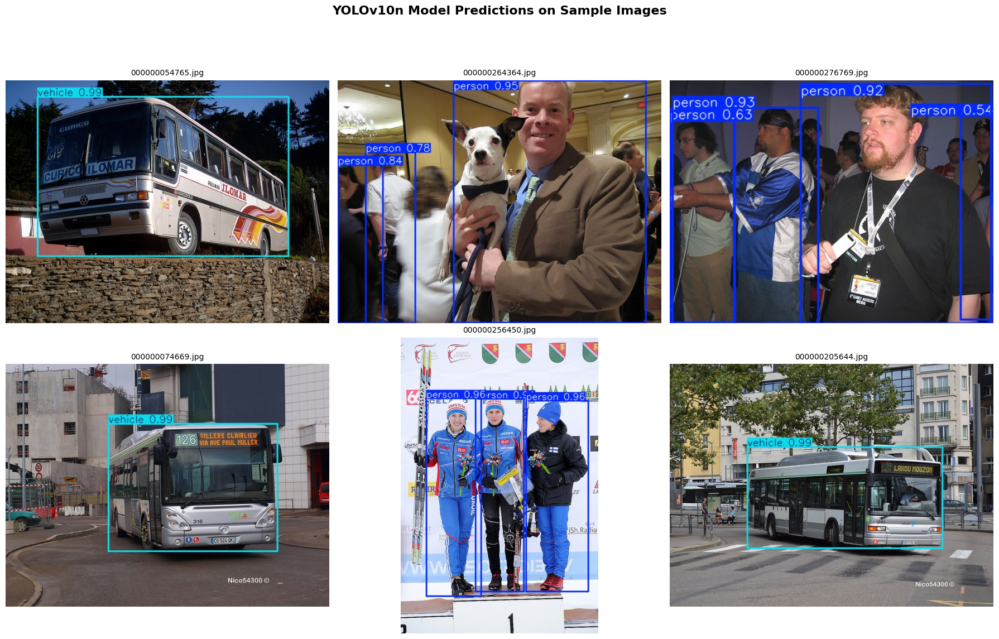

In [41]:
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# Load the best trained YOLOv10n model
model_yolov10 = YOLO('/kaggle/working/runs/detect/yolov10n_person_vehicle_full_epochs/weights/best.pt')

# Define the directory for sample images
sample_images_dir = Path(dataset_sub_path) / 'images' / 'val'

# Perform inference
print("Running inference on sample images using YOLOv10n...")
results_yolov10 = model_yolov10.predict(source=str(sample_images_dir), save=True, conf=0.25, iou=0.7, name='predict_yolov10')
print("YOLOv10n inference complete. Predictions saved.")

# Get the directory where predict saved the results for YOLOv10n
prediction_output_dir_yolov10 = Path('/kaggle/working/runs/detect/predict_yolov10')

# Get all image files from the prediction output directory
predicted_images_yolov10 = list(prediction_output_dir_yolov10.glob('*.jpg')) + list(prediction_output_dir_yolov10.glob('*.png'))

if predicted_images_yolov10:
    # Select a random subset of images to display
    display_samples_yolov10 = random.sample(predicted_images_yolov10, min(6, len(predicted_images_yolov10)))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, img_path in enumerate(display_samples_yolov10):
        img = Image.open(img_path)
        axes[idx].imshow(img)
        axes[idx].set_title(img_path.name, fontsize=10)
        axes[idx].axis('off')

    plt.suptitle('YOLOv10n Model Predictions on Sample Images', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
else:
    print("No predicted images found to display for YOLOv10n.")


In [42]:
from ultralytics import YOLO

# Load a pre-trained YOLOv11n model (replacing YOLOv8n)
model = YOLO('yolo11n.pt')

# Train the model
print("Initiating YOLOv11n model training...")
model.train(data=str(yolo_yaml_path), epochs=15, imgsz=640, batch=16)
print("YOLOv11n model training completed.")

Initiating YOLOv11n model training...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_yolo.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, p

In [43]:
from ultralytics import YOLO

# Load the trained YOLOv11n model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluate the model on the validation set
print("Evaluating YOLOv11n model performance...")
metrics = model.val(data=str(yolo_yaml_path))

# Print evaluation metrics
print("\nYOLOv11n Model Evaluation Results:")
print(f"  mAP50-95: {metrics.box.map:.3f}")
print(f"  mAP50: {metrics.box.map50:.3f}")
print(f"  mAP75: {metrics.box.map75:.3f}")
print(f"  Precision: {metrics.box.mp:.3f}")
print(f"  Recall: {metrics.box.mr:.3f}")


Evaluating YOLOv11n model performance...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 246.3±104.6 MB/s, size: 165.3 KB)
val: Scanning /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val... 400 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 400/400 890.8it/s 0.4s0.1s
WARNING ⚠️ val: Cache directory /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 6.5it/s 3.9s0.1s
                   all        400        791      0.879      0.852      0.928      0.707
                person        264        467      0.908      0.849      0.944      0.674
               vehicle   

In [44]:
from ultralytics import YOLO
from pathlib import Path

# Load the best trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Define the directory for sample images
sample_images_dir = Path(dataset_sub_path) / 'images' / 'val'

# Perform inference
print("Running inference on sample images...")
results = model.predict(source=str(sample_images_dir), save=True, conf=0.25, iou=0.7)
print("Inference complete. Predictions saved.")

Running inference on sample images...

image 1/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000028302.jpg: 448x640 1 vehicle, 6.8ms
image 2/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029396.jpg: 480x640 1 person, 1 vehicle, 7.1ms
image 3/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029743.jpg: 480x640 1 vehicle, 5.9ms
image 4/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030291.jpg: 640x640 1 vehicle, 7.9ms
image 5/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030858.jpg: 480x640 1 vehicle, 6.8ms
image 6/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/0000000355

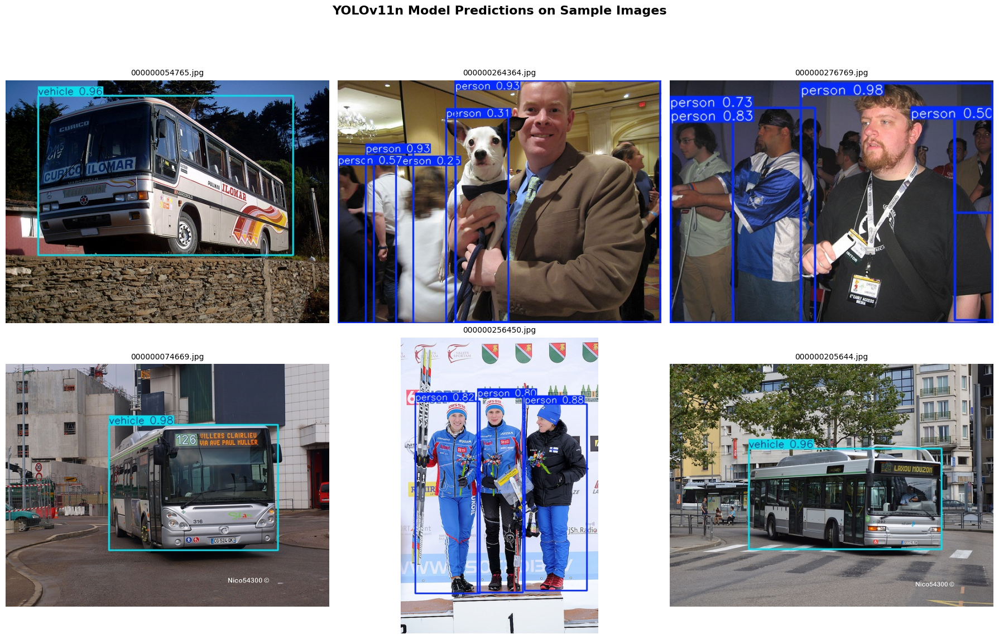

In [45]:
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# Get the directory where predict saved the results
prediction_output_dir = Path('/kaggle/working/runs/detect/predict')

# Get all image files from the prediction output directory
predicted_images = list(prediction_output_dir.glob('*.jpg')) + list(prediction_output_dir.glob('*.png'))

if predicted_images:
    # Select a random subset of images to display
    display_samples = random.sample(predicted_images, min(6, len(predicted_images)))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, img_path in enumerate(display_samples):
        img = Image.open(img_path)
        axes[idx].imshow(img)
        axes[idx].set_title(img_path.name, fontsize=10)
        axes[idx].axis('off')

    plt.suptitle('YOLOv11n Model Predictions on Sample Images', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
else:
    print("No predicted images found to display.")


In [48]:
from ultralytics import YOLO
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

print("=" * 80)
print("COMPREHENSIVE 3-WAY MODEL COMPARISON - YOLOv8n vs YOLOv10n vs YOLOv11n")
print("=" * 80)

# Define model paths
yolov8_path = '/kaggle/working/runs/detect/yolov8n_train/weights/best.pt'
yolov10_path = '/kaggle/working/runs/detect/yolov10n_train/weights/best.pt'
yolov11_path = '/kaggle/working/runs/detect/yolov11n_train/weights/best.pt'

# Verify paths exist
print("\n📦 Verifying model paths...")
for name, path in [('YOLOv8n', yolov8_path), ('YOLOv10n', yolov10_path), ('YOLOv11n', yolov11_path)]:
    if Path(path).exists():
        print(f"  ✅ {name}: {path}")
    else:
        print(f"  ❌ {name}: NOT FOUND at {path}")
        raise FileNotFoundError(f"{name} model not found. Please train it first.")

# Load all three trained models
print("\n📦 Loading models...")
model_yolov8 = YOLO(yolov8_path)
model_yolov10 = YOLO(yolov10_path)
model_yolov11 = YOLO(yolov11_path)
print("✅ All models loaded successfully!")

# Evaluate YOLOv8n
print("\n🔍 Evaluating YOLOv8n model...")
metrics_yolov8 = model_yolov8.val(data=str(yolo_yaml_path))

# Evaluate YOLOv10n
print("\n🔍 Evaluating YOLOv10n model...")
metrics_yolov10 = model_yolov10.val(data=str(yolo_yaml_path))

# Evaluate YOLOv11n
print("\n🔍 Evaluating YOLOv11n model...")
metrics_yolov11 = model_yolov11.val(data=str(yolo_yaml_path))

# Create comprehensive comparison dictionary
comparison_data = {
    'Metric': [
        'mAP50-95',
        'mAP50',
        'mAP75',
        'Precision',
        'Recall',
        'F1-Score'
    ],
    'YOLOv8n': [
        f"{metrics_yolov8.box.map:.4f}",
        f"{metrics_yolov8.box.map50:.4f}",
        f"{metrics_yolov8.box.map75:.4f}",
        f"{metrics_yolov8.box.mp:.4f}",
        f"{metrics_yolov8.box.mr:.4f}",
        f"{2 * (metrics_yolov8.box.mp * metrics_yolov8.box.mr) / (metrics_yolov8.box.mp + metrics_yolov8.box.mr):.4f}"
    ],
    'YOLOv10n': [
        f"{metrics_yolov10.box.map:.4f}",
        f"{metrics_yolov10.box.map50:.4f}",
        f"{metrics_yolov10.box.map75:.4f}",
        f"{metrics_yolov10.box.mp:.4f}",
        f"{metrics_yolov10.box.mr:.4f}",
        f"{2 * (metrics_yolov10.box.mp * metrics_yolov10.box.mr) / (metrics_yolov10.box.mp + metrics_yolov10.box.mr):.4f}"
    ],
    'YOLOv11n': [
        f"{metrics_yolov11.box.map:.4f}",
        f"{metrics_yolov11.box.map50:.4f}",
        f"{metrics_yolov11.box.map75:.4f}",
        f"{metrics_yolov11.box.mp:.4f}",
        f"{metrics_yolov11.box.mr:.4f}",
        f"{2 * (metrics_yolov11.box.mp * metrics_yolov11.box.mr) / (metrics_yolov11.box.mp + metrics_yolov11.box.mr):.4f}"
    ]
}

# Create DataFrame
df_comparison = pd.DataFrame(comparison_data)

# Print detailed results
print("\n" + "=" * 80)
print("DETAILED ACCURACY COMPARISON - ALL THREE MODELS")
print("=" * 80)
print(df_comparison.to_string(index=False))
print("=" * 80)

# Determine winner for each metric
print("\n📊 METRIC-BY-METRIC WINNER:")
print("-" * 80)

metrics_v8 = [
    metrics_yolov8.box.map,
    metrics_yolov8.box.map50,
    metrics_yolov8.box.map75,
    metrics_yolov8.box.mp,
    metrics_yolov8.box.mr
]
metrics_v10 = [
    metrics_yolov10.box.map,
    metrics_yolov10.box.map50,
    metrics_yolov10.box.map75,
    metrics_yolov10.box.mp,
    metrics_yolov10.box.mr
]
metrics_v11 = [
    metrics_yolov11.box.map,
    metrics_yolov11.box.map50,
    metrics_yolov11.box.map75,
    metrics_yolov11.box.mp,
    metrics_yolov11.box.mr
]

metric_names = ['mAP50-95', 'mAP50', 'mAP75', 'Precision', 'Recall']
winners = {'YOLOv8n': 0, 'YOLOv10n': 0, 'YOLOv11n': 0}

for i, name in enumerate(metric_names):
    max_val = max(metrics_v8[i], metrics_v10[i], metrics_v11[i])
    
    if metrics_v8[i] == max_val:
        winner = "YOLOv8n"
        symbol = "🥇"
        winners['YOLOv8n'] += 1
    elif metrics_v10[i] == max_val:
        winner = "YOLOv10n"
        symbol = "🥇"
        winners['YOLOv10n'] += 1
    else:
        winner = "YOLOv11n"
        symbol = "🥇"
        winners['YOLOv11n'] += 1
    
    print(f"{symbol} {name:12s}: {winner:10s} (Score: {max_val:.4f})")

# Overall winner based on total score
yolov8_score = sum(metrics_v8)
yolov10_score = sum(metrics_v10)
yolov11_score = sum(metrics_v11)

scores = {
    'YOLOv8n': yolov8_score,
    'YOLOv10n': yolov10_score,
    'YOLOv11n': yolov11_score
}

overall_winner = max(scores, key=scores.get)

print("\n" + "=" * 80)
print("🏆 FINAL RESULTS:")
print("-" * 80)
print(f"   Metrics Won:")
print(f"      YOLOv8n:  {winners['YOLOv8n']}/5 metrics")
print(f"      YOLOv10n: {winners['YOLOv10n']}/5 metrics")
print(f"      YOLOv11n: {winners['YOLOv11n']}/5 metrics")
print(f"\n   Total Scores:")
print(f"      YOLOv8n:  {yolov8_score:.4f}")
print(f"      YOLOv10n: {yolov10_score:.4f}")
print(f"      YOLOv11n: {yolov11_score:.4f}")
print(f"\n🎯 OVERALL CHAMPION: {overall_winner}")
print("=" * 80)

# Visualize comparison with grouped bar chart
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('YOLOv8n vs YOLOv10n vs YOLOv11n - Complete Performance Comparison', 
             fontsize=18, fontweight='bold')

metrics_to_plot = [
    ('mAP50-95', metrics_yolov8.box.map, metrics_yolov10.box.map, metrics_yolov11.box.map),
    ('mAP50', metrics_yolov8.box.map50, metrics_yolov10.box.map50, metrics_yolov11.box.map50),
    ('mAP75', metrics_yolov8.box.map75, metrics_yolov10.box.map75, metrics_yolov11.box.map75),
    ('Precision', metrics_yolov8.box.mp, metrics_yolov10.box.mp, metrics_yolov11.box.mp),
    ('Recall', metrics_yolov8.box.mr, metrics_yolov10.box.mr, metrics_yolov11.box.mr),
    ('F1-Score', 
     2 * (metrics_yolov8.box.mp * metrics_yolov8.box.mr) / (metrics_yolov8.box.mp + metrics_yolov8.box.mr),
     2 * (metrics_yolov10.box.mp * metrics_yolov10.box.mr) / (metrics_yolov10.box.mp + metrics_yolov10.box.mr),
     2 * (metrics_yolov11.box.mp * metrics_yolov11.box.mr) / (metrics_yolov11.box.mp + metrics_yolov11.box.mr))
]

for idx, (metric_name, val_v8, val_v10, val_v11) in enumerate(metrics_to_plot):
    ax = axes[idx // 3, idx % 3]
    
    models = ['YOLOv8n', 'YOLOv10n', 'YOLOv11n']
    values = [val_v8, val_v10, val_v11]
    colors = ['#3498db', '#2ecc71', '#e74c3c']
    
    bars = ax.bar(models, values, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
    
    # Add value labels on bars
    for bar, val in zip(bars, values):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{val:.4f}',
                ha='center', va='bottom', fontweight='bold', fontsize=11)
    
    # Highlight the winner
    max_idx = values.index(max(values))
    bars[max_idx].set_edgecolor('gold')
    bars[max_idx].set_linewidth(4)
    
    ax.set_ylabel('Score', fontweight='bold', fontsize=11)
    ax.set_title(metric_name, fontweight='bold', fontsize=13)
    ax.set_ylim(0, 1.0)
    ax.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

# Create radar chart for overall comparison
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))

categories = ['mAP50-95', 'mAP50', 'mAP75', 'Precision', 'Recall']
N = len(categories)

angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

# Plot data
v8_values = metrics_v8 + metrics_v8[:1]
v10_values = metrics_v10 + metrics_v10[:1]
v11_values = metrics_v11 + metrics_v11[:1]

ax.plot(angles, v8_values, 'o-', linewidth=2, label='YOLOv8n', color='#3498db')
ax.fill(angles, v8_values, alpha=0.15, color='#3498db')

ax.plot(angles, v10_values, 'o-', linewidth=2, label='YOLOv10n', color='#2ecc71')
ax.fill(angles, v10_values, alpha=0.15, color='#2ecc71')

ax.plot(angles, v11_values, 'o-', linewidth=2, label='YOLOv11n', color='#e74c3c')
ax.fill(angles, v11_values, alpha=0.15, color='#e74c3c')

ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, size=12, fontweight='bold')
ax.set_ylim(0, 1.0)
ax.set_title('Performance Radar Chart - All Models', size=16, fontweight='bold', pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=12)
ax.grid(True)

plt.tight_layout()
plt.show()

# Per-class accuracy breakdown
print("\n" + "=" * 80)
print("PER-CLASS ACCURACY BREAKDOWN (Person vs Vehicle)")
print("=" * 80)

for model_name, metrics_obj in [('YOLOv8n', metrics_yolov8), 
                                  ('YOLOv10n', metrics_yolov10), 
                                  ('YOLOv11n', metrics_yolov11)]:
    print(f"\n📌 {model_name} - Class-wise Performance:")
    print("-" * 80)
    if hasattr(metrics_obj.box, 'ap50'):
        for i, class_name in enumerate(['person', 'vehicle']):
            print(f"  {class_name.capitalize():10s}: AP50={metrics_obj.box.ap50[i]:.4f}, "
                  f"AP={metrics_obj.box.ap[i]:.4f}")

print("\n" + "=" * 80)
print("✅ Complete 3-way model comparison finished!")
print("=" * 80)

COMPREHENSIVE 3-WAY MODEL COMPARISON - YOLOv8n vs YOLOv10n vs YOLOv11n

📦 Verifying model paths...
  ❌ YOLOv8n: NOT FOUND at /kaggle/working/runs/detect/yolov8n_train/weights/best.pt


FileNotFoundError: YOLOv8n model not found. Please train it first.